In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Import Libraries

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import skimage.io as io
from skimage.transform import resize
from skimage import transform
from skimage.transform import resize
from skimage.draw import circle
import h5py
import scipy.io as sio

import tensorflow as tf
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Activation, BatchNormalization, Conv2D, Conv2DTranspose, concatenate
from keras.layers import Input, AveragePooling2D, Reshape, Permute, MaxPooling2D, UpSampling2D
from keras.layers import Bidirectional, LSTM
from keras.models import Model, load_model
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.applications.vgg19 import VGG19
from keras.applications.resnet50 import ResNet50
import keras.backend as K
K.set_image_data_format('channels_last')

## Utils

In [2]:
def create_dataset(data_path, image_type, start_id, end_id, rgb, lwir, joints, sigma=15):
  """
  Read the data and create a dataset
  """
  # initializations
  X = np.empty((0, 256, 256, 3), dtype=np.uint8)
  Y = np.empty((0, 256, 256, 3), dtype=np.uint8)
  C = np.empty((0, 256, 256, 14), dtype=np.uint8)
  ids = np.arange(start_id, end_id, 1)
  x = np.linspace(0, 576, 576)
  y = np.linspace(0, 1024, 1024)
  xx, yy = np.meshgrid(x, y)

  # access each directory
  for i in range(len(ids)):
    if ids[i] < 10:
      id = "0000{}".format(ids[i])
    else:  
      id = "000{}".format(ids[i])
    print("Obtaining images from...{}".format(id))

    # get homography transformation matrices
    H_rgb = np.array(np.load(os.path.join(data_path, id, "align_PTr_RGB.npy")))
    H_ir = np.array(np.load(os.path.join(data_path, id, "align_PTr_IR.npy")))
    H = np.matmul(np.linalg.inv(H_ir), H_rgb) # IR -> RGB tarnsformation matrix
    S = np.diag([576/256, 1024/256, 1]) # 256 x 256 scaling matrix
    tform = transform.ProjectiveTransform(matrix=np.matmul(H, S)) # IR -> RGB -> 256 x 256

    # get RGB joint coordinates
    if joints:
      J_rgb_dict = sio.loadmat(os.path.join(data_path, id, "joints_gt_RGB.mat"))
    
    path_X = os.path.join(data_path, id, "RGB", image_type)
    file_list = sorted(os.listdir(path_X))
    j = 0
    for file in file_list:
      if file.endswith(".png"):
          if rgb:
            # get RGB images
            path_im = os.path.join(path_X, file)
            im_X = tf.keras.preprocessing.image.load_img(path_im, target_size=(256, 256))
            im_X = tf.keras.preprocessing.image.img_to_array(im_X)
            im_X = np.array(im_X, dtype=np.uint8)
            # im_X = transform.warp(im_X, tform)
            # im_X = im_X[0:160, 0:120]
            X = np.vstack((X, im_X.reshape(1, 256, 256, 3)))

          if lwir:
            # get LWIR images
            path_Y = os.path.join(data_path, id, "IR", image_type)
            path_im = os.path.join(path_Y, file)
            im_Y = tf.keras.preprocessing.image.load_img(path_im, grayscale=False)
            im_Y = tf.keras.preprocessing.image.img_to_array(im_Y)
            im_Y = transform.warp(im_Y, tform, output_shape=(256, 256))
            im_Y = np.array(im_Y, dtype=np.uint8)
            Y = np.vstack((Y, im_Y.reshape(1, 256, 256, 3)))

          # get Joint Confidence Maps
          if joints:
            J_rgb = J_rgb_dict['joints_gt'][:, :, j]
            joint_maps = np.empty((1, 256, 256, 0), dtype=np.uint8)
            for k in range(14):
              xc = J_rgb[0, k]
              yc = J_rgb[1, k]
              map = 1/(2*np.pi*sigma**2)*np.exp(-(xx-xc)**2/(2*sigma**2)-(yy-yc)**2/(2*sigma**2))
              # map = transform.warp(map, tform)
              # map = map[0:160, 0:120]
              map = resize(map, (256, 256), anti_aliasing=False)
              map /= np.max(map)
              map = np.array(map*255, dtype=np.uint8)
              joint_maps = np.concatenate((joint_maps, np.expand_dims(map, [0, -1])), axis=-1)
            C = np.vstack((C, joint_maps))
            j += 1          

    # save dataset
    if rgb:
      dataset_id = "RGB_{}_{:n}_{:n}.hdf5".format(image_type, start_id, end_id)
    if lwir:
      dataset_id = "LWIR_{}_{:n}_{:n}.hdf5".format(image_type, start_id, end_id)
    if joints:  
      dataset_id = "Joints_{}_{:n}_{:n}.hdf5".format(image_type, start_id, end_id) 
    
    dataset = h5py.File(os.path.join("/content/drive/MyDrive/vip_cup_2021/data", dataset_id), mode='w')

    if rgb:
      dataset.create_dataset('X', data=X)
    if lwir:
      dataset.create_dataset('Y', data=Y)
    if joints:
      dataset.create_dataset('J', data=C)
    dataset.close() 

def load_data(dataset_id, data_id):
    """
    load data from the sepcified dataset
    """
    save_path = '/content/drive/MyDrive/vip_cup_2021/data/{}.hdf5'.format(dataset_id)
    dataset = h5py.File(save_path, mode='r')
    X = np.array(dataset[data_id])
    dataset.close()
    return X

def get_pose_coords(pose_dict):
  """
  given the keypoint confidence maps, obtain the keypoint coordinates
  """
  J = np.zeros((2, 14))
  for i in range(pose_dict.shape[-1]):
    coords = np.unravel_index(pose_dict[..., i].argmax(), pose_dict[..., i].shape)
    J[:, i] = np.array([coords[1], coords[0]])
  return J

def plot(*argv, titles=None):
  """
  display an arbitrary amount of images
  """
    fig, axes = plt.subplots(1, len(argv))
    ax = axes.ravel()  
    for i in range(len(argv)):
      ax[i].imshow(argv[i].squeeze())
      if titles is not None:
        ax[i].set_title(titles[i])
    fig.tight_layout()
    plt.show()

def plot_pose(J, im=None, ax=None, size=(256, 256)):
  """
  given the keypoint coordinate array, plot the pose stick figure
  """
  joint_labels = [
      "Right ankle",
      "Right knee",
      "Right hip",
      "Left hip",
      "Left knee",
      "Left ankle",
      "Right wrist",
      "Right elbow",
      "Right shoulder",
      "Left shoulder",
      "Left elbow",
      "Left wrist",
      "Thorax",
      "Head top"
  ]
  
  joint_pos_dict = {}
  for i in range(14):
    joint_pos_dict[joint_labels[i]] = np.array([J[0, i], J[1, i]])
  
  right_leg = ["Right ankle", "Right knee", "Right hip"]
  left_leg = ["Left ankle", "Left knee", "Left hip"]
  right_arm = ["Right wrist", "Right elbow","Right shoulder"]
  left_arm = ["Left wrist", "Left elbow","Left shoulder"]
  head = ["Thorax", "Head top"]
  arm_connections = ["Right shoulder", "Thorax", "Left shoulder"]
  leg_connections = ["Right hip", "Thorax", "Left hip"]
  parts = [right_leg, left_leg, right_arm, left_arm, head, arm_connections, leg_connections]

  if im is not None:
    if ax is not None:
      ax.imshow(im)
    else:
      plt.imshow(im)
  else:    
    im = np.zeros(size)
    plt.imshow(im)
  for part in parts:
    part_coords = np.zeros((len(part), 2))
    for i in range(len(part)):
      part_coords[i] = joint_pos_dict[part[i]]
    if ax is not None:
      ax.plot(part_coords[:, 0], part_coords[:, 1], marker='o')
    else:
      plt.plot(part_coords[:, 0], part_coords[:, 1], marker='o')
  if ax is None:
    plt.show()

## Network

### Vanilla U-Net

In [ ]:
class VanillaUNet():
    """
    Vanilla U-Net Architecture
    """
    def __init__(self, input_shape):
        super(VanillaUNet, self).__init__()
        self.input_shape = input_shape

    def getModel(self):
        """
        Vanilla U-Net Architecture
        """
        ## input to the network
        input = Input(self.input_shape)

        ## encoder network
        c1 = Conv2D(filters=16, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(input)
        c1 = BatchNormalization()(c1)
        c1 = Activation('relu')(c1)
        p1 = MaxPooling2D()(c1)

        c2 = Conv2D(filters=32, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(p1)
        c2 = BatchNormalization()(c2)
        c2 = Activation('relu')(c2)
        p2 = MaxPooling2D()(c2)

        c3 = Conv2D(filters=64, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(p2)
        c3 = BatchNormalization()(c3)
        c3 = Activation('relu')(c3)
        p3 = MaxPooling2D()(c3)

        c4 = Conv2D(filters=128, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(p3)
        c4 = BatchNormalization()(c4)
        c4 = Activation('relu')(c4)
        p4 = MaxPooling2D()(c4)

        # decoder Network
        u5 = Conv2DTranspose(filters=128, kernel_size=(3, 3), strides=(2, 2), padding='same')(p4)
        u5 = concatenate([u5, c4])
        c5 = Conv2D(filters=128, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(u5)
        c5 = BatchNormalization()(c5)
        c5 = Activation('relu')(c5)

        u6 = Conv2DTranspose(filters=64, kernel_size=(3, 3), strides=(2, 2), padding='same')(c5)
        u6 = concatenate([u6, c3])
        c6 = Conv2D(filters=64, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(u6)
        c6 = BatchNormalization()(c6)
        c6 = Activation('relu')(c6)

        u7 = Conv2DTranspose(filters=32, kernel_size=(3, 3), strides=(2, 2), padding='same')(c6)
        u7 = concatenate([u7, c2])
        c7 = Conv2D(filters=32, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(u7)
        c7 = BatchNormalization()(c7)
        c7 = Activation('relu')(c7)

        u8 = Conv2DTranspose(filters=32, kernel_size=(3, 3), strides=(2, 2), padding='same')(c7)
        u8 = concatenate([u8, c1])
        c8 = Conv2D(filters=32, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(u8)
        c8 = BatchNormalization()(c8)
        c8 = Activation('relu')(c8)

        ## output layer
        output = Conv2D(filters=14, kernel_size=(1, 1), padding='same', name='out')(c8)
        output = Activation('sigmoid')(output)

        ## define the model
        model = Model(inputs=[input], outputs=[output])
        return model

### Stacked Hourglass Network

In [ ]:
class StackedHourGlassNet():
    """
    The joint convolutional and spatial quad-directional LSTM network proposed by
    M. V. Perera and A. De Silva, "A Joint Convolutional and Spatial Quad-Directional 
    LSTM Network for Phase Unwrapping," ICASSP 2021 - 2021 IEEE International Conference 
    on Acoustics, Speech and Signal Processing (ICASSP), 2021, pp. 4055-4059, 
    doi: 10.1109/ICASSP39728.2021.9414748.
    """
    def __init__(self, input_shape):
        super(StackedHourGlassNet, self).__init__()
        self.input_shape = input_shape

    def ResidualBlock(self, x):
      """
      residual block implementation
      """
      c1 = Conv2D(filters=128, kernel_size=(1,1), kernel_initializer='he_normal', padding='same')(x)
      c1 = BatchNormalization()(c1)
      c1 = Activation('relu')(c1)

      c2 = Conv2D(filters=128, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(c1)
      c2 = BatchNormalization()(c2)
      c2 = Activation('relu')(c2)

      c3 = Conv2D(filters=256, kernel_size=(1,1), kernel_initializer='he_normal', padding='same')(c2)
      c3 = BatchNormalization()(c3)
      out = Activation('relu')(c3 + x)
      return out

    def SingleHourGlassNet(self):
      """
      A single hour glass network
      """
      ## input to the network
      input = Input(self.input_shape)
      i1 = Conv2D(filters=256, kernel_size=(3, 3), padding='same')(input)
      i1 = BatchNormalization()(i1)
      i1 = Activation('relu')(i1)

      ## encoder network
      r1 = self.ResidualBlock(i1)
      p1 = MaxPooling2D()(r1)

      r2 = self.ResidualBlock(p1)
      p2 = MaxPooling2D()(r2)

      r3 = self.ResidualBlock(p2)
      p3 = MaxPooling2D()(r3)

      r4 = self.ResidualBlock(p3)

      ## decoder network
      r5 = self.ResidualBlock(r4 + p3)
      u5 = UpSampling2D()(r5)
      # u5 = Conv2DTranspose(filters=256, kernel_size=(3, 3), strides=(2, 2), padding='same')(r5)

      r6 = self.ResidualBlock(u5 + p2)
      u6 = UpSampling2D()(r6)
      # u6 = Conv2DTranspose(filters=256, kernel_size=(3, 3), strides=(2, 2), padding='same')(r6)

      r7 = self.ResidualBlock(u6 + p1)
      u7 = UpSampling2D()(r7)
      # u7 = Conv2DTranspose(filters=256, kernel_size=(3, 3), strides=(2, 2), padding='same')(r7)

      ## genrate heatmaps
      out = Conv2D(filters=128, kernel_size=(1, 1), padding='same')(u7)
      out = Activation('relu')(out)

      out = Conv2D(filters=14, kernel_size=(1, 1), padding='same')(out)
      output = Activation('linear')(out)
      
      ## define the model
      model = Model(inputs=[input], outputs=[output])
      return model

### DeeperCut

In [ ]:
class DeeperCut():
    """
    A network with ResNet50 backbone
    """
    def __init__(self, input_shape):
        super(DeeperCut, self).__init__()
        self.input_shape = input_shape

        # get vgg19 model
        vgg19 = VGG19(
            weights="imagenet", 
            input_shape=input_shape,
            include_top=False
        )

        # form the backbone
        self.backbone = vgg19
        self.backbone.trainable = False

        self.backbone_2 = Model(vgg19.input,  vgg19.get_layer(index = -2).output)
        self.backbone_2.trainable = False

        self.backbone_7 = Model(vgg19.input,  vgg19.get_layer(index = -7).output)
        self.backbone_7.trainable = False

        self.backbone_12 = Model(vgg19.input,  vgg19.get_layer(index = -12).output)
        self.backbone_12.trainable = False

        self.backbone_17 = Model(vgg19.input,  vgg19.get_layer(index = -17).output)
        self.backbone_17.trainable = False

        self.backbone_20 = Model(vgg19.input,  vgg19.get_layer(index = -20).output)
        self.backbone_20.trainable = False

    def getModel(self):
        """
        Defines the joint convoltional and spatial quad-directional LSTM network
        """
        ## input to the network
        inputs = Input(self.input_shape)

        # encoder (vgg19 backbone)
        x = self.backbone(inputs, training=False)
        x2 = self.backbone_2(inputs, training=False)
        x7 = self.backbone_7(inputs, training=False)
        x12 = self.backbone_12(inputs, training=False)
        x17 = self.backbone_17(inputs, training=False)
        x20 = self.backbone_20(inputs, training=False)

        # decoder Network
        u5 = Conv2DTranspose(512, kernel_size=(3, 3), strides=(2, 2), padding='same')(x)
        u5 = concatenate([u5, x2])
        c5 = Conv2D(filters=512, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(u5)
        c5 = BatchNormalization()(c5)
        c5 = Activation('relu')(c5)

        u6 = Conv2DTranspose(512, kernel_size=(3, 3), strides=(2, 2), padding='same')(c5)
        u6 = concatenate([u6, x7])
        c6 = Conv2D(filters=512, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(u6)
        c6 = BatchNormalization()(c6)
        c6 = Activation('relu')(c6)

        u7 = Conv2DTranspose(256, kernel_size=(3, 3), strides=(2, 2), padding='same')(c6)
        u7 = concatenate([u7, x12])
        c7 = Conv2D(filters=256, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(u7)
        c7 = BatchNormalization()(c7)
        c7 = Activation('relu')(c7)

        u8 = Conv2DTranspose(128, kernel_size=(3, 3), strides=(2, 2), padding='same')(c7)
        u8 = concatenate([u8, x17])
        c8 = Conv2D(filters=128, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(u8)
        c8 = BatchNormalization()(c8)
        c8 = Activation('relu')(c8)

        u9 = Conv2DTranspose(64, kernel_size=(3, 3), strides=(2, 2), padding='same')(c8)
        u9 = concatenate([u9, x20])
        c9 = Conv2D(filters=64, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(u9)
        c9 = BatchNormalization()(c9)
        c9 = Activation('relu')(c9)

        ## output layer
        outputs = Conv2D(filters=14, kernel_size=(1, 1), padding='same')(c9)
        outputs = Activation('linear')(outputs)

        ## define the model
        model = Model(inputs, outputs)
        return model

### PoseNetVGG19

In [ ]:
class PoseNet():
    """
     This class contains the PoseNetVGG19 architecture
    """
    def __init__(self, input_shape):
        super(PoseNet, self).__init__()
        self.input_shape = input_shape

        # get vgg19 model
        vgg19 = VGG19(
            weights="imagenet", 
            input_shape=input_shape,
            include_top=False
        )

        # form the backbone
        inputs = vgg19.input
        outputs = vgg19.output
        outputs_2 = vgg19.get_layer(index = -2).output
        outputs_7 = vgg19.get_layer(index = -7).output
        outputs_12 = vgg19.get_layer(index = -12).output
        outputs_17 = vgg19.get_layer(index = -17).output
        outputs_20 = vgg19.get_layer(index = -20).output

        self.backbone = Model([vgg19.input], [outputs, outputs_2, outputs_7, outputs_12, outputs_17, outputs_20])

    def getModel(self, training=False):
        """
        Defines PoseNetVGG19 archietcture
        """
        ## input to the network
        inputs = Input(self.input_shape)

        # encoder (vgg19 backbone)
        self.backbone.trainable = training
        x, x2, x7, x12, x17, x20 = self.backbone(inputs, training=training)

        # decoder Network
        u5 = Conv2DTranspose(512, kernel_size=(3, 3), strides=(2, 2), padding='same')(x)
        u5 = concatenate([u5, x2])
        c5 = Conv2D(filters=512, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(u5)
        c5 = BatchNormalization()(c5)
        c5 = Activation('relu')(c5)

        u6 = Conv2DTranspose(512, kernel_size=(3, 3), strides=(2, 2), padding='same')(c5)
        u6 = concatenate([u6, x7])
        c6 = Conv2D(filters=512, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(u6)
        c6 = BatchNormalization()(c6)
        c6 = Activation('relu')(c6)

        u7 = Conv2DTranspose(256, kernel_size=(3, 3), strides=(2, 2), padding='same')(c6)
        u7 = concatenate([u7, x12])
        c7 = Conv2D(filters=256, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(u7)
        c7 = BatchNormalization()(c7)
        c7 = Activation('relu')(c7)

        u8 = Conv2DTranspose(128, kernel_size=(3, 3), strides=(2, 2), padding='same')(c7)
        u8 = concatenate([u8, x17])
        c8 = Conv2D(filters=128, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(u8)
        c8 = BatchNormalization()(c8)
        c8 = Activation('relu')(c8)

        u9 = Conv2DTranspose(64, kernel_size=(3, 3), strides=(2, 2), padding='same')(c8)
        u9 = concatenate([u9, x20])
        c9 = Conv2D(filters=64, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(u9)
        c9 = BatchNormalization()(c9)
        c9 = Activation('relu')(c9)

        ## output layer
        outputs = Conv2D(filters=14, kernel_size=(1, 1), padding='same')(c9)
        outputs = Activation('relu')(outputs)

        outputs = Conv2D(filters=14, kernel_size=(1, 1), padding='same')(outputs)
        outputs = Activation('sigmoid')(outputs)

        ## define the model
        model = Model(inputs, outputs)
        return model

### PoseNetVGG19 + Domain Adaptation

In [3]:
class DAPoseNet():
    """
    This class contains a PoseNetVGG19 (base model) and a U-Net arhcitecture (top model -- to learn a mapping between LWIR and RGB)
    """
    def __init__(self, input_shape):
        super(DAPoseNet, self).__init__()
        self.input_shape = input_shape

        # get vgg19 model
        vgg19 = VGG19(
            weights="imagenet", 
            input_shape=input_shape,
            include_top=False
        )

        # form the backbone
        inputs = vgg19.input
        outputs = vgg19.output
        outputs_2 = vgg19.get_layer(index = -2).output
        outputs_7 = vgg19.get_layer(index = -7).output
        outputs_12 = vgg19.get_layer(index = -12).output
        outputs_17 = vgg19.get_layer(index = -17).output
        outputs_20 = vgg19.get_layer(index = -20).output

        self.backbone = Model([vgg19.input], [outputs, outputs_2, outputs_7, outputs_12, outputs_17, outputs_20])

    def getBaseModel(self, training=False):
        """
        Defines the PoseNetVGG19
        """
        ## input to the network
        inputs = Input(self.input_shape)

        # encoder (vgg19 backbone)
        self.backbone.trainable = training
        x, x2, x7, x12, x17, x20 = self.backbone(inputs, training=training)

        # decoder Network
        u5 = Conv2DTranspose(512, kernel_size=(3, 3), strides=(2, 2), padding='same')(x)
        u5 = concatenate([u5, x2])
        c5 = Conv2D(filters=512, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(u5)
        c5 = BatchNormalization()(c5)
        c5 = Activation('relu')(c5)

        u6 = Conv2DTranspose(512, kernel_size=(3, 3), strides=(2, 2), padding='same')(c5)
        u6 = concatenate([u6, x7])
        c6 = Conv2D(filters=512, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(u6)
        c6 = BatchNormalization()(c6)
        c6 = Activation('relu')(c6)

        u7 = Conv2DTranspose(256, kernel_size=(3, 3), strides=(2, 2), padding='same')(c6)
        u7 = concatenate([u7, x12])
        c7 = Conv2D(filters=256, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(u7)
        c7 = BatchNormalization()(c7)
        c7 = Activation('relu')(c7)

        u8 = Conv2DTranspose(128, kernel_size=(3, 3), strides=(2, 2), padding='same')(c7)
        u8 = concatenate([u8, x17])
        c8 = Conv2D(filters=128, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(u8)
        c8 = BatchNormalization()(c8)
        c8 = Activation('relu')(c8)

        u9 = Conv2DTranspose(64, kernel_size=(3, 3), strides=(2, 2), padding='same')(c8)
        u9 = concatenate([u9, x20])
        c9 = Conv2D(filters=64, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(u9)
        c9 = BatchNormalization()(c9)
        c9 = Activation('relu')(c9)

        ## output layer
        outputs = Conv2D(filters=14, kernel_size=(1, 1), padding='same')(c9)
        outputs = Activation('relu')(outputs)

        outputs = Conv2D(filters=14, kernel_size=(1, 1), padding='same')(outputs)
        outputs = Activation('sigmoid')(outputs)

        ## define the model
        model = Model(inputs, outputs)
        return model

    def getUNet(self):
        """
        Defines the U-Net
        """
        ## input to the network
        input = Input(self.input_shape)

        ## encoder network
        c1 = Conv2D(filters=16, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(input)
        c1 = BatchNormalization()(c1)
        c1 = Activation('relu')(c1)
        p1 = MaxPooling2D()(c1)

        c2 = Conv2D(filters=32, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(p1)
        c2 = BatchNormalization()(c2)
        c2 = Activation('relu')(c2)
        p2 = MaxPooling2D()(c2)

        c3 = Conv2D(filters=64, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(p2)
        c3 = BatchNormalization()(c3)
        c3 = Activation('relu')(c3)
        p3 = MaxPooling2D()(c3)

        c4 = Conv2D(filters=128, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(p3)
        c4 = BatchNormalization()(c4)
        c4 = Activation('relu')(c4)
        p4 = MaxPooling2D()(c4)

        # decoder Network
        u5 = Conv2DTranspose(filters=128, kernel_size=(3, 3), strides=(2, 2), padding='same')(p4)
        u5 = concatenate([u5, c4])
        c5 = Conv2D(filters=128, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(u5)
        c5 = BatchNormalization()(c5)
        c5 = Activation('relu')(c5)

        u6 = Conv2DTranspose(filters=64, kernel_size=(3, 3), strides=(2, 2), padding='same')(c5)
        u6 = concatenate([u6, c3])
        c6 = Conv2D(filters=64, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(u6)
        c6 = BatchNormalization()(c6)
        c6 = Activation('relu')(c6)

        u7 = Conv2DTranspose(filters=32, kernel_size=(3, 3), strides=(2, 2), padding='same')(c6)
        u7 = concatenate([u7, c2])
        c7 = Conv2D(filters=32, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(u7)
        c7 = BatchNormalization()(c7)
        c7 = Activation('relu')(c7)

        u8 = Conv2DTranspose(filters=16, kernel_size=(3, 3), strides=(2, 2), padding='same')(c7)
        u8 = concatenate([u8, c1])
        c8 = Conv2D(filters=16, kernel_size=(3,3), kernel_initializer='he_normal', padding='same')(u8)
        c8 = BatchNormalization()(c8)
        c8 = Activation('relu')(c8)

        ## output layer
        output = Conv2D(filters=3, kernel_size=(1, 1), padding='same')(c8)
        output = Activation('relu')(output)

        output = Conv2D(filters=3, kernel_size=(1, 1), padding='same')(output)
        output = Activation('relu')(output)

        ## define the model
        model = Model(inputs=[input], outputs=[output])
        return model


## Create Dataset

In [ ]:
## create dataset 
data_path = "/content/drive/MyDrive/vip_cup_2021/data/train"
create_dataset(data_path=data_path, 
               image_type="uncover", 
               start_id=26, 
               end_id=31,
               rgb=False,
               lwir=True,
               joints=False)

## User Inputs

In [ ]:
## Good Models
# U-Net + PoseNet with VGG19-backbone - Model_DAPoseNetVGG19_LWIR_Uncovered_Train
# PoseNet with VGG19-backbone (fine-tuned) - Model_PoseNetVGG19_RGB_Uncovered_FT_Train 
# PoseNet with VGG19-backbone - Model_PoseNetVGG19_RGB_Uncovered_Train 

In [4]:
## user inputs

# which network to train
use_VanillUNet = False
use_SingleHourGlassNet = False
use_PoseNet = False
use_DAPoseNet = True

# which dataset to use
dataset_id = "Uncovered_LWIR"
image_size = (256, 256, 3)

# training specs
fine_tune_flag = False      # True if you want to fine-tune
fine_tune_model_path = ""   # fine-tune model path
lr = 1e-3
loss = "mean_squared_error" # experiment with binary cross entropy too
batch_size = 16
epochs = 500
initial_epoch=0

## Load Data

In [5]:
## load data
X_train = load_data("LWIR_uncover_1_26", "Y").astype(np.float32)/255
Y_train = load_data("Joints_uncover_1_26", "J").astype(np.float32)/255

In [ ]:
# ## binarize joint confidence maps (for binary cross-entropy loss)
# Y_train[Y_train >= 0.5] = 1
# Y_train[Y_train < 0.5] = 0

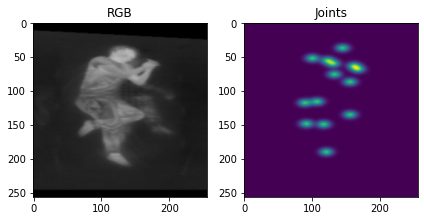

In [6]:
## visualize a pair
idx = np.random.randint(0, X_train.shape[0])
X = X_train[idx]
Y = np.sum(Y_train[idx], axis=-1)
plot(X, Y, titles=["RGB", "Joints"])

In [7]:
## Define the image generators (don't add augmentations)
rgb_datagen = ImageDataGenerator(
    rotation_range=0
)
joints_datagen = ImageDataGenerator(
    rotation_range=0
)
seed = 1
rgb_generator = rgb_datagen.flow(X_train, seed=seed, batch_size=batch_size)
joints_generator = joints_datagen.flow(Y_train, seed=seed, batch_size=batch_size)
train_generator = zip(rgb_generator, joints_generator)

/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/numpy_array_iterator.py:136: UserWarning: NumpyArrayIterator is set to use the data format convention "channels_last" (channels on axis 3), i.e. expected either 1, 3, or 4 channels on axis 3. However, it was passed an array with shape (1125, 256, 256, 14) (14 channels).
  str(self.x.shape[channels_axis]) + ' channels).')


## Define Model

In [11]:
## get model
if use_VanillUNet:
    network_id = 'VanillaUNet'
    model = VanillaUNet(image_size).getModel()
    model.summary()

if use_SingleHourGlassNet:
    network_id = 'SingleHourGlassNet'
    model = StackedHourGlassNet(image_size).SingleHourGlassNet()
    model.summary()

if use_PoseNet:
    network_id = 'PoseNetVGG19'
    model = PoseNet(image_size).getModel(training=fine_tune_flag)
    model.summary()

if use_DAPoseNet:
    network_id = 'DAPoseNetVGG19'

    # define basemodel
    basemodel = load_model("/content/drive/MyDrive/vip_cup_2021/models/Model_PoseNetVGG19_RGB_Uncovered_FT.h5")
    basemodel.trainable = False
    
    # define topmodel 
    unet = DAPoseNet((256, 256, 3)).getUNet()

    # define the top model + base model network
    inputs = Input((256, 256, 3))
    x = unet(inputs, training=True)
    outputs = basemodel(x, training=False)
    model = Model(inputs, outputs)
    model.summary()

## define model specs
if fine_tune_flag:
    model.load_weights(fine_tune_model_path)
    model_path = fine_tune_model_path
else:
    model_id = 'Model_{}_{}'.format(network_id,dataset_id)
    model_path = '/content/drive/MyDrive/vip_cup_2021/models/{}.h5'.format(model_id)

model.compile(
    optimizer=Adam(learning_rate=lr),
    loss=loss
)

earlystopper = EarlyStopping(
    monitor='loss',
    patience=5,
    verbose=1
)

model_checkpoint = ModelCheckpoint(
    model_path,
    monitor='loss',
    verbose=1,
    save_best_only=True
)

Model: "model_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
model_4 (Functional)         (None, 256, 256, 3)       735807    
_________________________________________________________________
model_1 (Functional)         (None, 256, 256, 14)      37286688  
Total params: 38,022,495
Trainable params: 734,847
Non-trainable params: 37,287,648
_________________________________________________________________


## Train Model

In [12]:
# # if you want to resume training, run this:
# model = load_model("/content/drive/MyDrive/vip_cup_2021/models/Model_DAPoseNet_Uncovered_LWIR_Train.h5")
# model.summary()
# initial_epoch=33

Model: "model_45"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_48 (InputLayer)        [(None, 256, 256, 3)]     0         
_________________________________________________________________
model_44 (Functional)        (None, 256, 256, 3)       735807    
_________________________________________________________________
model_1 (Functional)         (None, 256, 256, 14)      37286688  
Total params: 38,022,495
Trainable params: 734,847
Non-trainable params: 37,287,648
_________________________________________________________________


In [13]:
## train the model
history = model.fit(
    train_generator,
    steps_per_epoch=150,
    epochs=epochs,
    verbose=1,
    callbacks=[model_checkpoint, earlystopper],
    initial_epoch=initial_epoch 
)

Epoch 34/500
150/150 [==============================] - 156s 655ms/step - loss: 8.2390e-05

Epoch 00034: loss improved from inf to 0.00008, saving model to /content/drive/MyDrive/vip_cup_2021/models/Model_DAPoseNet_Uncovered_LWIR_Train.h5
Epoch 35/500
150/150 [==============================] - 95s 636ms/step - loss: 8.3954e-05

Epoch 00035: loss did not improve from 0.00008
Epoch 36/500
150/150 [==============================] - 97s 646ms/step - loss: 8.1347e-05

Epoch 00036: loss improved from 0.00008 to 0.00008, saving model to /content/drive/MyDrive/vip_cup_2021/models/Model_DAPoseNet_Uncovered_LWIR_Train.h5
Epoch 37/500
150/150 [==============================] - 97s 649ms/step - loss: 7.8240e-05

Epoch 00037: loss improved from 0.00008 to 0.00008, saving model to /content/drive/MyDrive/vip_cup_2021/models/Model_DAPoseNet_Uncovered_LWIR_Train.h5
Epoch 38/500
150/150 [==============================] - 98s 650ms/step - loss: 7.3954e-05

Epoch 00038: loss improved from 0.00008 to 0.000

## Model Convergence

<function matplotlib.pyplot.show>

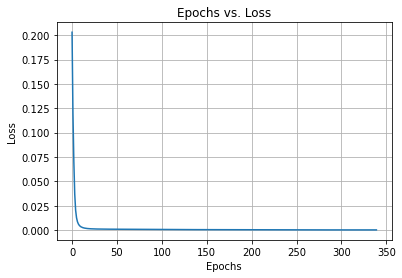

In [ ]:
## plot epochs vs loss
loss = history.history['loss']
epochs = np.arange(0, len(loss), 1)
plt.plot(epochs, loss)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Epochs vs. Loss")
plt.grid()
plt.show

## RGB Inference

In [ ]:
## load model
model = load_model("/content/drive/MyDrive/vip_cup_2021/models/Model_PoseNet_Uncovered_FT_Train.h5")
batch_size = 32

In [ ]:
## load test dataset
X_test = load_data("RGB_uncover_26_31", "X").astype(np.float32)/255
Y_test = load_data("Joints_uncover_26_31", "J").astype(np.float32)/255

In [ ]:
## predict IR image
Y_pred = model.predict(X_test, batch_size=batch_size, verbose=1)

8/8 [==============================] - 22s 762ms/step


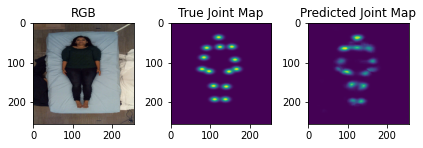

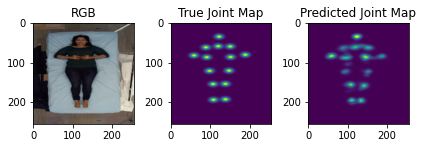

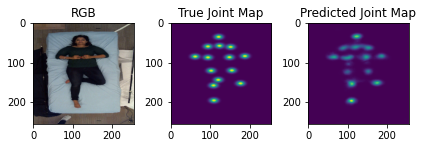

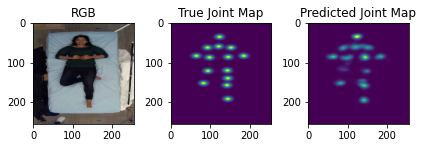

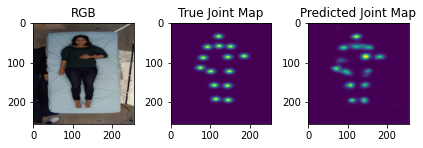

...

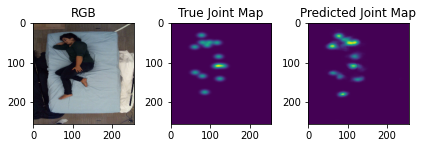

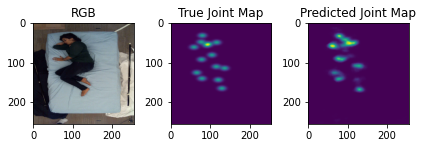

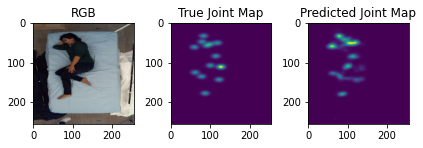

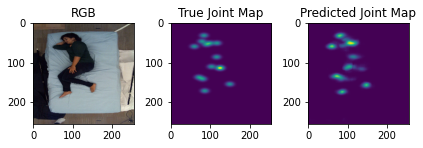

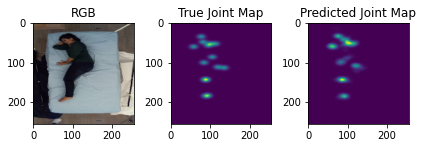

In [ ]:
## Visualize some results
# indices = np.random.randint(0, X_test.shape[0], size=(10, ))
indices = np.arange(0, 45, 1)
for i in range(len(indices)):
  Xi = X_test[indices[i]]
  Yi = np.sum(Y_test[indices[i]], axis=-1)
  Ypi = np.sum(Y_pred[indices[i]], axis=-1)

  # visualize
  plot(Xi, Yi, Ypi, titles=["RGB", "True Joint Map", "Predicted Joint Map"])

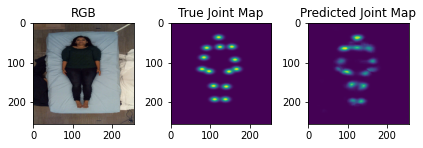

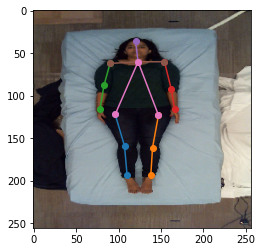

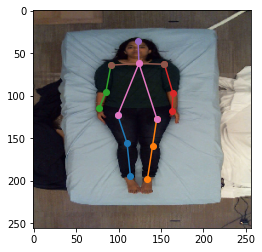

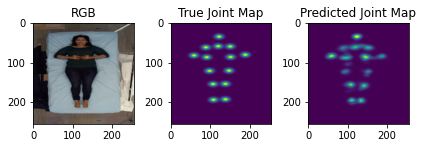

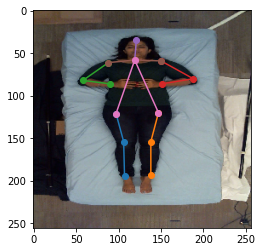

...

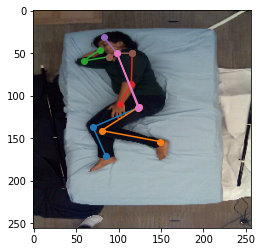

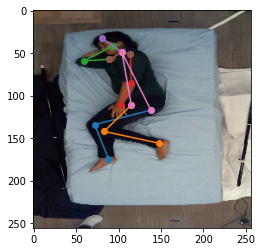

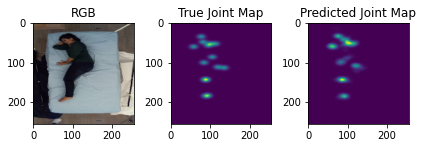

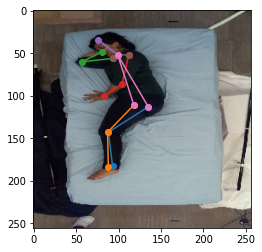

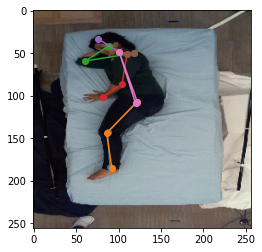

In [ ]:
## Visualize some results
for i in range(len(indices)):
  Xi = X_test[indices[i]]
  Yi = np.sum(Y_test[indices[i]], axis=-1)
  Ypi = np.sum(Y_pred[indices[i]], axis=-1)

  # visualize
  plot(Xi, Yi, Ypi, titles=["RGB", "True Joint Map", "Predicted Joint Map"])

  # for j in range(14):
  #   plt.imshow(Y_pred[indices[i], :, :, j])
  #   plt.show()

  Ji = get_pose_coords(Y_test[indices[i]])
  Jpi = get_pose_coords(Y_pred[indices[i]])
  plot_pose(Ji, Xi)
  plot_pose(Jpi, Xi)

## LWIR Inference

In [14]:
## load model
model = load_model("/content/drive/MyDrive/vip_cup_2021/models/Model_DAPoseNetVGG19_Uncovered_LWIR.h5")
batch_size = 32

In [15]:
## load test dataset
X_test = load_data("RGB_uncover_26_31", "X").astype(np.float32)/255
IR_test = load_data("LWIR_uncover_26_31", "Y").astype(np.float32)/255 
Y_test = load_data("Joints_uncover_26_31", "J").astype(np.float32)/255

In [16]:
## predict IR image
Y_pred = model.predict(IR_test, batch_size=batch_size, verbose=1)

8/8 [==============================] - 26s 925ms/step


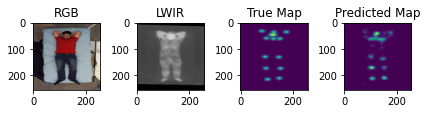

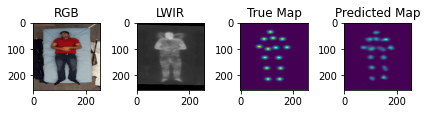

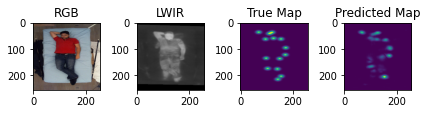

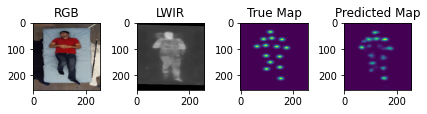

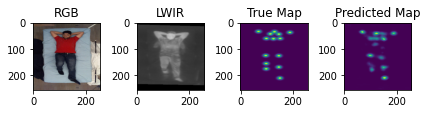

...

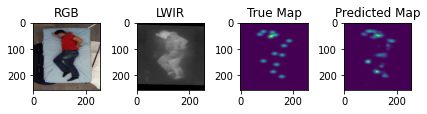

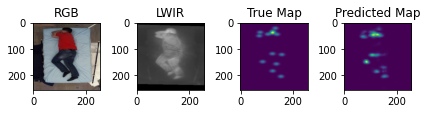

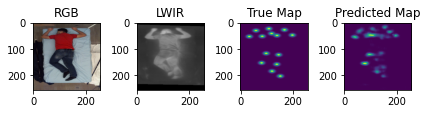

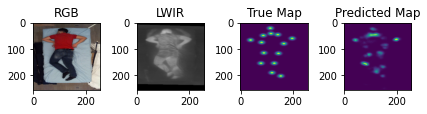

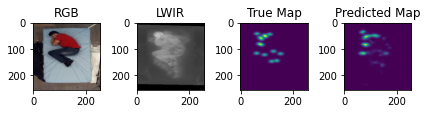

In [17]:
## Visualize some results
# indices = np.random.randint(0, X_test.shape[0], size=(10, ))
indices = np.arange(180, 225, 1)
for i in range(len(indices)):
  Xi = X_test[indices[i]]
  IRi = IR_test[indices[i]]
  Yi = np.sum(Y_test[indices[i]], axis=-1)
  Ypi = np.sum(Y_pred[indices[i]], axis=-1)

  # visualize
  plot(Xi, IRi, Yi, Ypi, titles=["RGB", "LWIR", "True Map", "Predicted Map"])

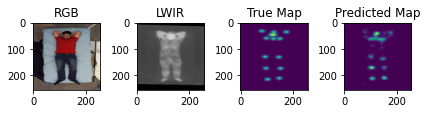

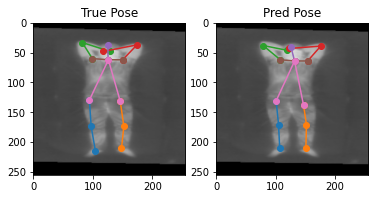

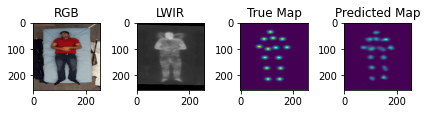

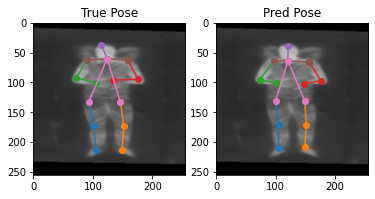

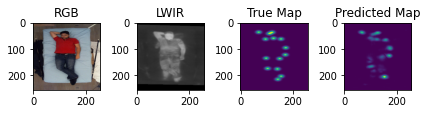

...

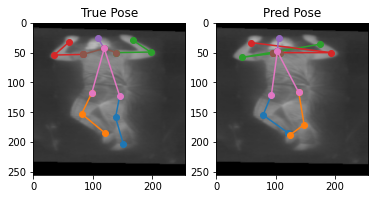

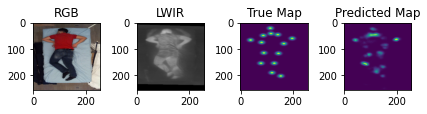

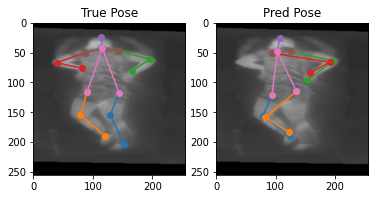

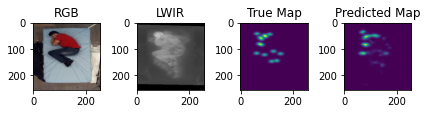

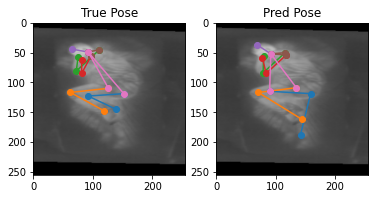

In [18]:
## Visualize some results
for i in range(len(indices)):
  Xi = X_test[indices[i]]
  IRi = IR_test[indices[i]]
  Yi = np.sum(Y_test[indices[i]], axis=-1)
  Ypi = np.sum(Y_pred[indices[i]], axis=-1)

  # visualize
  plot(Xi, IRi, Yi, Ypi, titles=["RGB", "LWIR","True Map", "Predicted Map"])

  # for j in range(14):
  #   plt.imshow(Y_pred[indices[i], :, :, j])
  #   plt.show()

  Ji = get_pose_coords(Y_test[indices[i]])
  Jpi = get_pose_coords(Y_pred[indices[i]])
  
  ax1 = plt.subplot(1, 2, 1)
  ax2 = plt.subplot(1, 2, 2)
  plot_pose(Ji, IRi, ax=ax1)
  plot_pose(Jpi, IRi, ax=ax2)
  ax1.set_title("True Pose")
  ax2.set_title("Pred Pose")
  plt.show()

## Dev

In [ ]:
import scipy.io as sio
from skimage.draw import line
import matplotlib.pyplot as plt

In [ ]:
data_path = "/content/drive/MyDrive/vip_cup_2021/data/train"
id = "00025"

In [ ]:
# get homography transformation matrices
H_rgb = np.array(np.load(os.path.join(data_path, id, "align_PTr_RGB.npy")))
H_ir = np.array(np.load(os.path.join(data_path, id, "align_PTr_IR.npy")))

In [ ]:
path_im = "/content/drive/MyDrive/vip_cup_2021/data/train/00025/IR/uncover/image_000001.png"
im_Y = tf.keras.preprocessing.image.load_img(path_im)
im_Y = tf.keras.preprocessing.image.img_to_array(im_Y)
im_Y = np.array(im_Y, dtype=np.uint8)

In [ ]:
imk = io.imread(path_im)
imk.shape

(160, 120)

In [ ]:
im_Y.shape

(160, 120, 3)

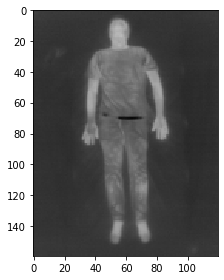

In [ ]:
io.imshow(im_Y)

In [ ]:
H = np.matmul(np.linalg.inv(H_ir), H_rgb) # IR -> RGB tarnsformation
tform = transform.ProjectiveTransform(matrix=H)

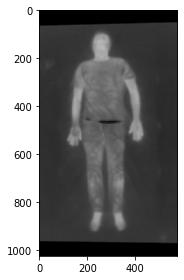

In [ ]:
im = transform.warp(im_Y, tform, output_shape=(1024, 576))
io.imshow(im)

In [ ]:
im.shape

(1024, 576, 3)

In [ ]:
print(np.sum(im[..., 0] - im[..., 1]))

0.0


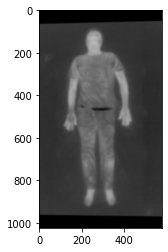

In [ ]:
plt.imshow(im)
plt.show()

In [ ]:
path_im = "/content/drive/MyDrive/vip_cup_2021/data/train/00025/RGB/uncover/image_000001.png"
im_X = tf.keras.preprocessing.image.load_img(path_im)
im_X = tf.keras.preprocessing.image.img_to_array(im_X)
im_X = np.array(im_X, dtype=np.uint8)

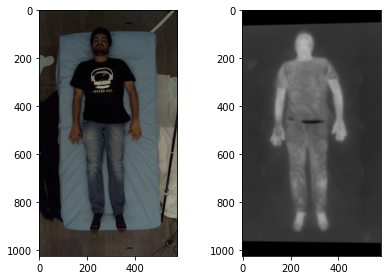

In [ ]:
plot(im_X, im)

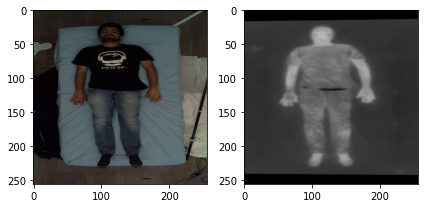

In [ ]:
S = np.diag([576/256, 1024/256, 1])
scale = transform.ProjectiveTransform(matrix=S)
imm = transform.warp(im_X, scale)[:256, :256]

tform = transform.ProjectiveTransform(matrix=np.matmul(H, S))
imm1 = transform.warp(im_Y, tform, output_shape=(256, 256))

plot(imm, imm1)


In [ ]:
J_ir_dict = sio.loadmat(os.path.join(data_path, id, "joints_gt_RGB.mat"))

In [ ]:
 J_ir_dict['joints_gt'].shape

(3, 14, 45)

In [ ]:
J_ir = J_ir_dict['joints_gt'][:, :, 0]
J_ir

array([[243.93951262, 242.15709312, 235.02741514, 322.36597041,
        340.19016536, 336.62532637, 163.73063534, 176.2075718 ,
        210.07354221, 363.3616188 , 386.53307224, 388.31549173,
        281.37032202, 283.15274151],
       [857.39817232, 696.98041775, 531.2154047 , 531.2154047 ,
        704.11009574, 859.18059182, 500.91427328, 383.2745866 ,
        258.50522193, 254.94038294, 383.2745866 , 495.5670148 ,
        237.11618799, 117.69408181],
       [  0.        ,   0.        ,   0.        ,   0.        ,
          0.        ,   0.        ,   0.        ,   0.        ,
          0.        ,   0.        ,   0.        ,   0.        ,
          0.        ,   0.        ]])

In [ ]:
pose = np.zeros((1024, 576), dtype=np.int)
J_ir = np.round(J_ir).astype("int")
J_ir

array([[243, 242, 235, 322, 340, 336, 163, 176, 210, 363, 386, 388, 281,
        283],
       [857, 696, 531, 531, 704, 859, 500, 383, 258, 254, 383, 495, 237,
        117],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0]])

In [ ]:
def plot_pose(J, im=None, size=(256, 256)):
  joint_labels = [
      "Right ankle",
      "Right knee",
      "Right hip",
      "Left hip",
      "Left knee",
      "Left ankle",
      "Right wrist",
      "Right elbow",
      "Right shoulder",
      "Left shoulder",
      "Left elbow",
      "Left wrist",
      "Thorax",
      "Head top"
  ]
  
  joint_pos_dict = {}
  for i in range(14):
    joint_pos_dict[joint_labels[i]] = np.array([J[0, i], J[1, i]])
  
  right_leg = ["Right ankle", "Right knee", "Right hip"]
  left_leg = ["Left ankle", "Left knee", "Left hip"]
  right_arm = ["Right wrist", "Right elbow","Right shoulder"]
  left_arm = ["Left wrist", "Left elbow","Left shoulder"]
  head = ["Thorax", "Head top"]
  arm_connections = ["Right shoulder", "Thorax", "Left shoulder"]
  leg_connections = ["Right hip", "Thorax", "Left hip"]
  parts = [right_leg, left_leg, right_arm, left_arm, head, arm_connections, leg_connections]

  if im is not None:
    plt.imshow(im)
  else:    
    im = np.zeros(size)
    plt.imshow(im)
  for part in parts:
    part_coords = np.zeros((len(part), 2))
    for i in range(len(part)):
      part_coords[i] = joint_pos_dict[part[i]]
    plt.plot(part_coords[:, 0], part_coords[:, 1], marker='o')
  plt.show()

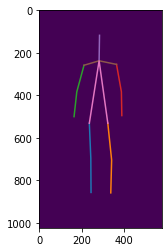

In [ ]:
plot_pose(J_ir, (1024, 576))

/usr/local/lib/python3.7/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Low image data range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


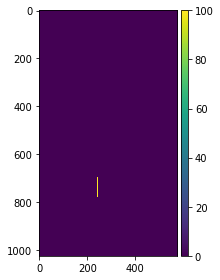

In [ ]:
rr, cc = line(857, 243, 696, 242)
pose[rr, cc] = 100
# rr, cc = line(J_ir[1, 1], J_ir[0, 1], J_ir[1, 2], J_ir[0, 2])
# pose[rr, cc] = 100
# rr, cc = line(J_ir[1, 0], J_ir[0, 0], J_ir[1, 1], J_ir[0, 1])
# pose[rr, cc] = 100
# rr, cc = line(J_ir[1, 1], J_ir[0, 1], J_ir[1, 2], J_ir[0, 2])
# pose[rr, cc] = 100
# rr, cc = line(J_ir[1, 4], J_ir[0, 4], J_ir[1, 5], J_ir[0, 5])
# pose[rr, cc] = 100
# rr, cc = line(J_ir[1, 3], J_ir[0, 3], J_ir[1, 4], J_ir[0, 4])
# pose[rr, cc] = 100
io.imshow(pose)

/usr/local/lib/python3.7/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Low image data range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)
/usr/local/lib/python3.7/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


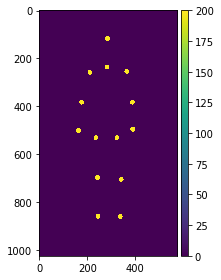

In [ ]:
io.imshow(pose)

In [ ]:
pose_dict = np.empty((0, 1024, 576), dtype=np.double)
sigma = 12
# get homography transformation matrices
H_rgb = np.array(np.load(os.path.join(data_path, id, "align_PTr_RGB.npy")))
H_ir = np.array(np.load(os.path.join(data_path, id, "align_PTr_IR.npy")))
H = np.matmul(np.linalg.inv(H_rgb), H_ir) # RGB -> IR tarnsformation
tform = transform.ProjectiveTransform(matrix=H)

x = np.linspace(0, 576, 576)
y = np.linspace(0, 1024, 1024)
xx, yy = np.meshgrid(x, y)
for i in range(14):
  xc = J_ir[0, i]
  yc = J_ir[1, i]
  map = 1/(2*np.pi*sigma**2)*np.exp(-(xx-xc)**2/(2*sigma**2)-(yy-yc)**2/(2*sigma**2))
  map /= np.max(map)
  pose_dict = np.concatenate((pose_dict, np.expand_dims(map, 0)), axis=0)

/usr/local/lib/python3.7/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


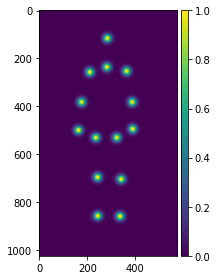

In [ ]:
pose_pred = np.sum(pose_dict, 0)
io.imshow(pose_pred)

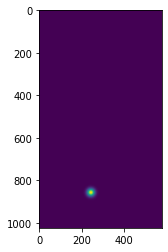

In [ ]:
plt.imshow(pose_dict[0])

In [ ]:
def get_pose_coords(pose_dict):
  J = np.zeros((2, 14))
  for i in range(len(pose_dict)):
    coords = np.unravel_index(pose_dict[i].argmax(), pose_dict[i].shape)
    J[:, i] = np.array([coords[1], coords[0]])
  return J

In [ ]:
J

array([[243., 242., 235., 321., 339., 335., 163., 176., 210., 362., 385.,
        387., 281., 283.],
       [856., 695., 530., 530., 703., 858., 500., 383., 258., 254., 383.,
        495., 237., 117.]])

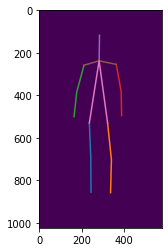

In [ ]:
J = get_pose_coords(pose_dict)
plot_pose(J, (1024, 576))

In [ ]:
im = io.imread("/content/drive/MyDrive/vip_cup_2021/data/train/00010/RGB/uncover/image_000001.png")

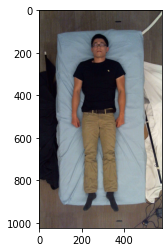

In [ ]:
plt.imshow(im)

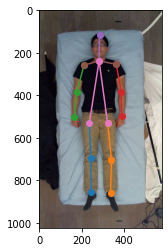

In [ ]:
plot_pose(J, im=im)